<a href="https://colab.research.google.com/github/RiyaCharly-TanviSomji/CMP7005/blob/main/Task_3_by_riya.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
from google.colab import drive
drive.mount('/content/drive')

ValueError: mount failed

In [ ]:
%cd /content/drive/MyDrive/CMP7005/

/content/drive/MyDrive/CMP7005


**Step 1: Load and Inspect the Dataset**

In [17]:
# !pip3 install streamlit
# !pip3 install scikit-learn
# !pip3 install pandas
# !pip3 install matplotlib
# !pip3 install seaborn

import pandas as pd


# Load the dataset
# data1 = pd.read_csv("datasets/PRSA_Data_Aotizhongxin_20130301-20170228.csv")
# data2 = pd.read_csv("datasets/PRSA_Data_Changping_20130301-20170228.csv")
# data3 = pd.read_csv("datasets/PRSA_Data_Dingling_20130301-20170228.csv")
# data4 = pd.read_csv("datasets/PRSA_Data_Dongsi_20130301-20170228.csv")
# data5 = pd.read_csv("datasets/PRSA_Data_Guanyuan_20130301-20170228.csv")
# data6 = pd.read_csv("datasets/PRSA_Data_Gucheng_20130301-20170228.csv")
# data7 = pd.read_csv("datasets/PRSA_Data_Huairou_20130301-20170228.csv")
# data8 = pd.read_csv("datasets/PRSA_Data_Nongzhanguan_20130301-20170228.csv")
# data9 = pd.read_csv("datasets/PRSA_Data_Shunyi_20130301-20170228.csv")
# data10 = pd.read_csv("datasets/PRSA_Data_Tiantan_20130301-20170228.csv")
# data11 = pd.read_csv("datasets/PRSA_Data_Wanliu_20130301-20170228.csv")
# data12 = pd.read_csv("datasets/PRSA_Data_Wanshouxigong_20130301-20170228.csv")




# # Merge all datasets into a single DataFrame
# data = pd.concat(
#     [data1, data2, data3, data4, data5, data6, data7, data8, data9, data10, data11, data12],
#     ignore_index=True
# )

# with open("datasets/merged_dataset.csv", "w") as f:
#     data.to_csv(f, index=False)
data = pd.read_csv("/content/merged_dataset.csv")
# Display the merged dataset
data.head(5)


# Basic inspection
print("Dataset Shape:", data.shape)
print("Columns:", data.columns)
print("Data Types:\n", data.dtypes)
print("Missing Values:\n", data.isnull().sum())



Dataset Shape: (300000, 18)
Columns: Index(['No', 'year', 'month', 'day', 'hour', 'PM2.5', 'PM10', 'SO2', 'NO2',
       'CO', 'O3', 'TEMP', 'PRES', 'DEWP', 'RAIN', 'wd', 'WSPM', 'station'],
      dtype='object')
Data Types:
 No           int64
year         int64
month        int64
day          int64
hour         int64
PM2.5      float64
PM10       float64
SO2        float64
NO2        float64
CO         float64
O3         float64
TEMP       float64
PRES       float64
DEWP       float64
RAIN       float64
wd          object
WSPM       float64
station     object
dtype: object
Missing Values:
 No             0
year           0
month          0
day            0
hour           0
PM2.5       6569
PM10        4739
SO2         6072
NO2         8953
CO         15797
O3          8146
TEMP         321
PRES         316
DEWP         326
RAIN         313
wd          1119
WSPM         266
station        0
dtype: int64


**Step 2: Data Preprocessing**

Handle Missing Values and Duplicates:

In [18]:
for col in data.select_dtypes(include=['float64', 'int64']).columns:
    data[col].fillna(data[col].median(), inplace=True)

if 'wd' in data.columns:
    data['wd'].fillna(data['wd'].mode().iloc[0], inplace=True)


data.drop_duplicates(inplace=True)

<ipython-input-18-b8a697eb70e6>:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  data[col].fillna(data[col].median(), inplace=True)
<ipython-input-18-b8a697eb70e6>:5: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try us

Feature Engineering and Encoding:

In [19]:
from sklearn.preprocessing import LabelEncoder


label_encoder = LabelEncoder()
data['wd'] = label_encoder.fit_transform(data['wd'])
print(data['wd'].unique())


[ 6  3  7  5  1  0  4 13 11 15  9 14 10  2  8 12]


**Step 3: Exploratory Data Analysis (EDA)**

Univariate Analysis:

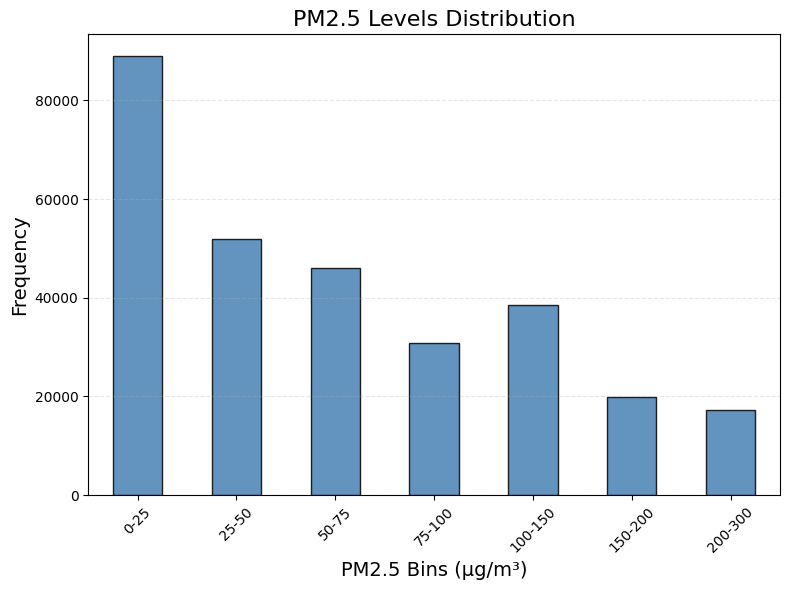

In [20]:
import numpy as np
import matplotlib.pyplot as plt
data2=data.copy()
bins = [0, 25, 50, 75, 100, 150, 200, 300]
labels = ['0-25', '25-50', '50-75', '75-100', '100-150', '150-200', '200-300']
data['PM2.5_Binned'] = pd.cut(data['PM2.5'], bins=bins, labels=labels)

bin_counts = data['PM2.5_Binned'].value_counts(sort=False)

plt.figure(figsize=(8, 6))
bin_counts.plot(kind='bar', color='steelblue', edgecolor='black', alpha=0.85)
plt.title('PM2.5 Levels Distribution', fontsize=16)
plt.xlabel('PM2.5 Bins (µg/m³)', fontsize=14)
plt.ylabel('Frequency', fontsize=14)
plt.xticks(rotation=45)
plt.grid(alpha=0.3, linestyle='--', axis='y')
plt.tight_layout()
plt.show()

Bivariate Analysis

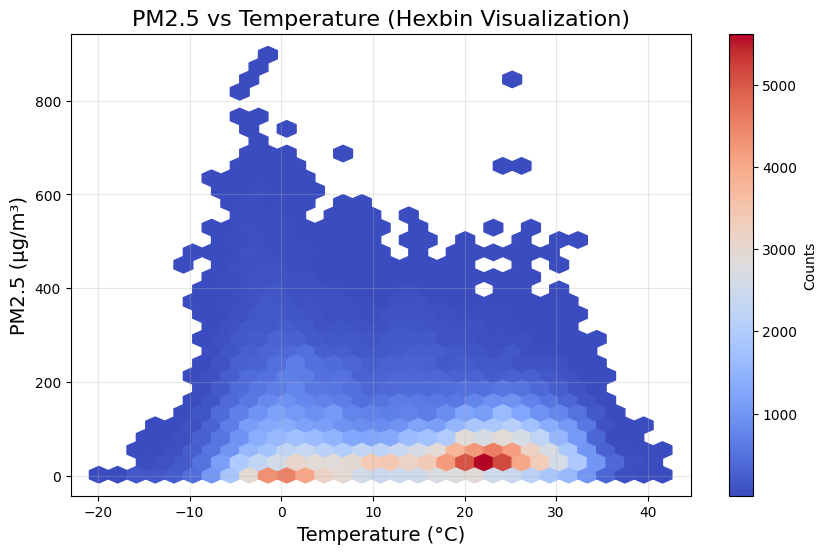

In [21]:
if data[['PM2.5', 'TEMP']].isnull().any().any():
    print("Dataset contains missing values. Filling them with mean values.")
    data['PM2.5'].fillna(data['PM2.5'].mean(), inplace=True)
    data['TEMP'].fillna(data['TEMP'].mean(), inplace=True)

plt.figure(figsize=(10, 6))
plt.hexbin(data['TEMP'], data['PM2.5'], gridsize=30, cmap='coolwarm', mincnt=1)
cb = plt.colorbar()
cb.set_label('Counts')


plt.title("PM2.5 vs Temperature (Hexbin Visualization)", fontsize=16)
plt.xlabel("Temperature (°C)", fontsize=14)
plt.ylabel("PM2.5 (µg/m³)", fontsize=14)
plt.grid(alpha=0.3)

plt.show()

Correlation Heatmap:

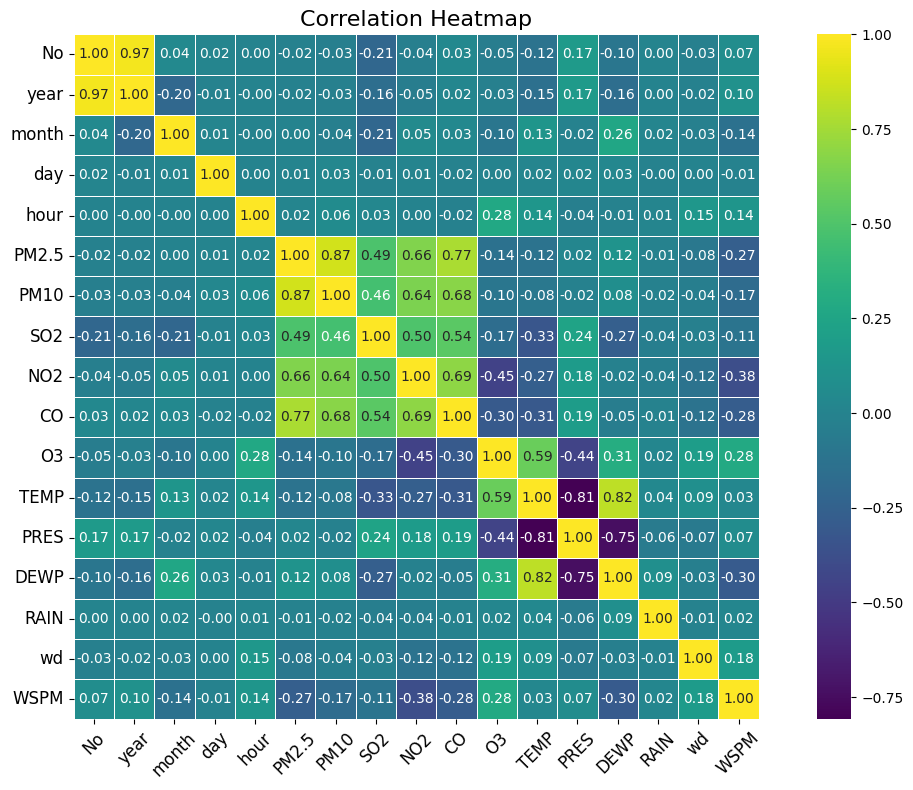

In [22]:
numeric_data = data.select_dtypes(include=['number'])
corr_matrix = numeric_data.corr()

plt.figure(figsize=(12, 8))
sns.heatmap(
    corr_matrix,
    annot=True,
    fmt=".2f",
    cmap="viridis",
    cbar=True,
    linewidths=0.5,
    square=True
)

plt.title('Correlation Heatmap', fontsize=16)
plt.xticks(fontsize=12, rotation=45)
plt.yticks(fontsize=12, rotation=0)

plt.tight_layout()
plt.show()

In [ ]:
!pip install ydata-profiling

from ydata_profiling import ProfileReport
profile = ProfileReport(data, title="Pandas Profiling Report", explorative=True)
profile.to_file("dataset_report.html")

# Display the report in Jupyter Notebook (optional)
profile.to_notebook_iframe()

  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 390.9/390.9 kB 12.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 18.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 686.1/686.1 kB 29.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 104.8/104.8 kB 7.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 52.0 MB/s eta 0:00:00
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27081 sha256=ec60125a1c27998206eef69858cdf484a23a5b0297f79710f39a002c39e56dc6
  Stored in directory: /root/.cache/pip/wheels/dd/91/29/a79cecb328d01739e64017b6fb9a1ab9d8cb1853098ec5966d
Successfully built htmlmin


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

**Step 4: Data Preparation for Modelling**

Select Features and Target Variable:

In [23]:
features = ['PM10', 'SO2', 'NO2', 'CO', 'O3', 'TEMP', 'PRES', 'DEWP', 'RAIN', 'WSPM', 'wd']
target = 'PM2.5'
data = data2.copy()
X = data[features]
y = data[target]

Split Data into Train-Test Sets:

In [32]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=70)

**Step 5: Model Building**

Train a Linear Regression Model:

In [33]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score

model = LinearRegression()
model.fit(X_train, y_train)

y_pred = model.predict(X_test)

mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
print("Mean Squared Error:", mse)
print("R-squared:", r2)

Mean Squared Error: 997.86751725882
R-squared: 0.8381384429274479


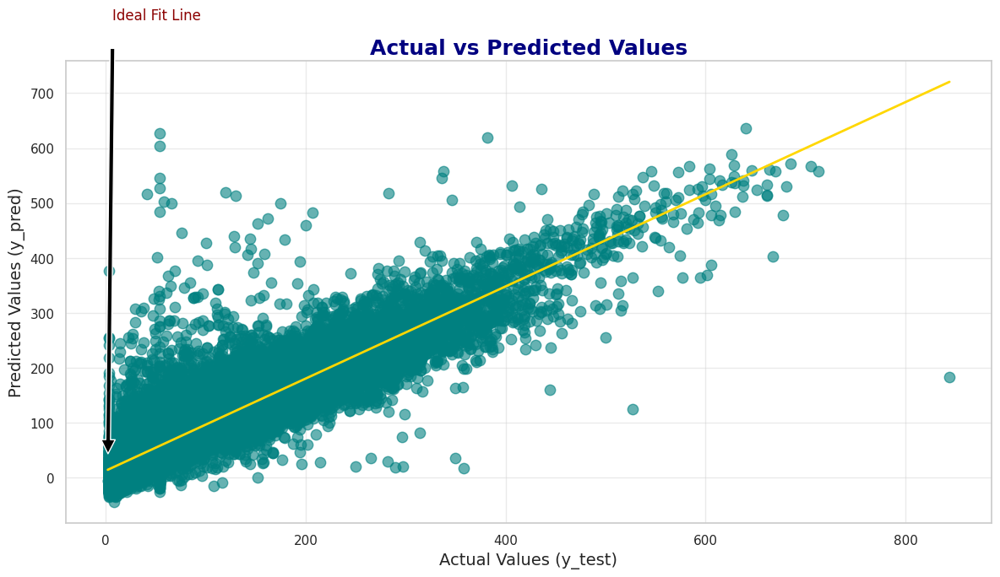

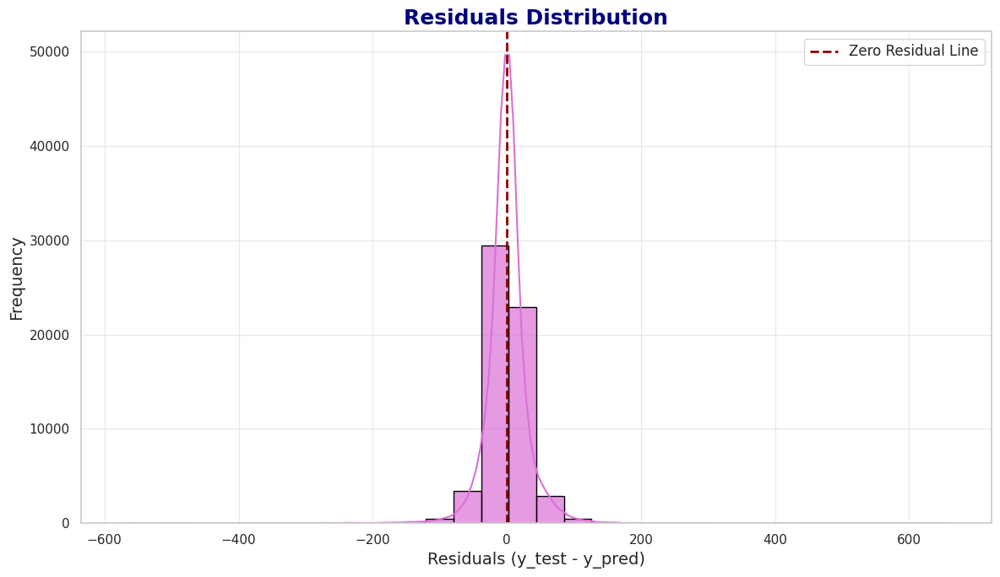

In [35]:


# Set plot style
sns.set_theme(style="whitegrid")

# Actual vs Predicted Values
plt.figure(figsize=(12, 7))
sns.regplot(x=y_test, y=y_pred, scatter_kws={'color': 'teal', 'alpha': 0.6, 's': 80},
            line_kws={'color': 'gold', 'linewidth': 2}, ci=None)
plt.title('Actual vs Predicted Values', fontsize=18, fontweight='bold', color='navy')
plt.xlabel('Actual Values (y_test)', fontsize=14)
plt.ylabel('Predicted Values (y_pred)', fontsize=14)
plt.annotate('Ideal Fit Line', xy=(y_test.min(), y_test.min()), xytext=(y_test.min() + 5, y_test.max() - 10),
             arrowprops=dict(facecolor='black', shrink=0.05), fontsize=12, color='darkred')
plt.grid(alpha=0.4)
plt.tight_layout()
plt.show()

# Residuals Plot
residuals = y_test - y_pred
plt.figure(figsize=(12, 7))
sns.histplot(residuals, kde=True, bins=30, color='orchid', edgecolor='black', alpha=0.7)
plt.axvline(x=0, color='darkred', linestyle='--', linewidth=2, label='Zero Residual Line')
plt.title('Residuals Distribution', fontsize=18, fontweight='bold', color='navy')
plt.xlabel('Residuals (y_test - y_pred)', fontsize=14)
plt.ylabel('Frequency', fontsize=14)
plt.legend(fontsize=12, loc='upper right')
plt.grid(alpha=0.4)
plt.tight_layout()
plt.show()



Train Additional Models (e.g., Gradient Boosting Regression) :

In [37]:
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.metrics import mean_squared_error, r2_score

gb_model = GradientBoostingRegressor(random_state=78)
gb_model.fit(X_train, y_train)

gb_pred = gb_model.predict(X_test)
gb_mse = mean_squared_error(y_test, gb_pred)
gb_r2 = r2_score(y_test, gb_pred)

print("Gradient Boosting - Mean Squared Error:", gb_mse)
print("Gradient Boosting - R-squared:", gb_r2)

Gradient Boosting - Mean Squared Error: 655.544299608368
Gradient Boosting - R-squared: 0.893665823138399


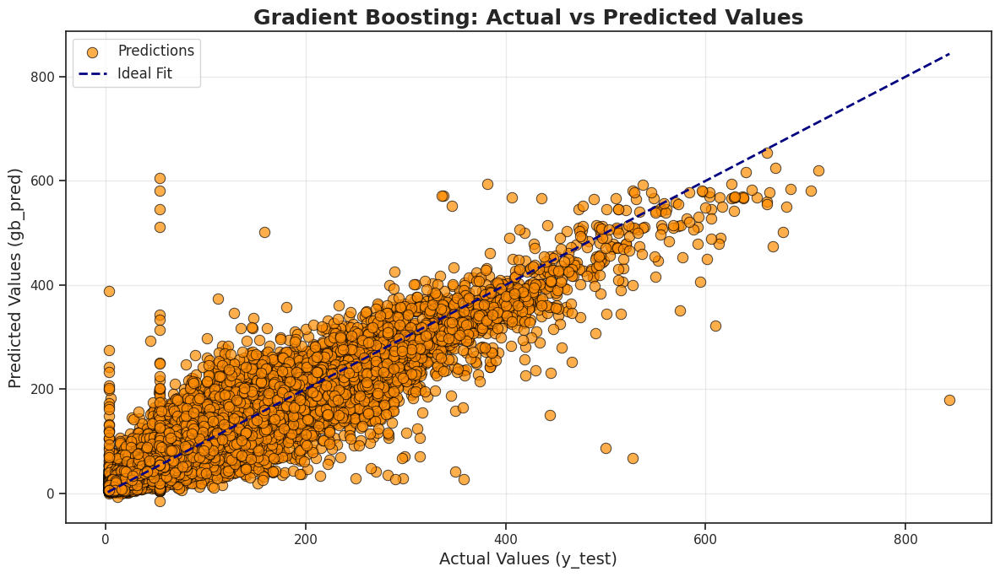

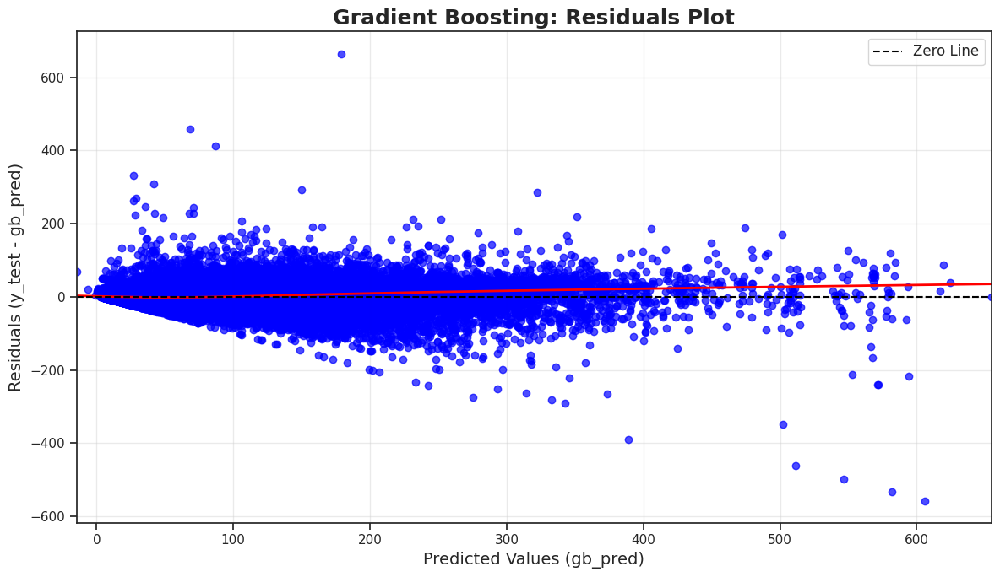

In [39]:

sns.set_theme(style="ticks")

# Gradient Boosting: Actual vs Predicted Values
plt.figure(figsize=(12, 7))
sns.scatterplot(x=y_test, y=gb_pred, color='darkorange', s=80, alpha=0.7, edgecolor='black', label='Predictions')
sns.lineplot(x=[y_test.min(), y_test.max()], y=[y_test.min(), y_test.max()], color='navy', lw=2, linestyle='--', label='Ideal Fit')
plt.title('Gradient Boosting: Actual vs Predicted Values', fontsize=18, fontweight='bold')
plt.xlabel('Actual Values (y_test)', fontsize=14)
plt.ylabel('Predicted Values (gb_pred)', fontsize=14)
plt.legend(fontsize=12, loc='upper left')
plt.grid(alpha=0.4)
plt.tight_layout()
plt.show()

# Gradient Boosting: Residuals Plot
gb_residuals = y_test - gb_pred
plt.figure(figsize=(12, 7))
sns.residplot(x=gb_pred, y=gb_residuals, lowess=True, scatter_kws={'alpha': 0.7, 'color': 'blue'},
              line_kws={'color': 'red', 'linewidth': 2})
plt.axhline(y=0, color='black', linestyle='--', linewidth=1.5, label='Zero Line')
plt.title('Gradient Boosting: Residuals Plot', fontsize=18, fontweight='bold')
plt.xlabel('Predicted Values (gb_pred)', fontsize=14)
plt.ylabel('Residuals (y_test - gb_pred)', fontsize=14)
plt.legend(fontsize=12, loc='upper right')
plt.grid(alpha=0.4)
plt.tight_layout()
plt.show()


**Step 6: Application Development (GUI)**

Create a Multipage Application:

In [ ]:
!pip install streamlit
!pip install pyngrok
!pip install streamlit -q

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.3/44.3 kB 2.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.1/9.1 MB 35.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.9/6.9 MB 62.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.1/79.1 kB 6.0 MB/s eta 0:00:00


In [ ]:
%%writefile app.py
import streamlit as st
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import GradientBoostingRegressor


# Load the dataset
def load_data():
    data = pd.read_csv("datasets/merged_dataset.csv")
    numeric_cols = data.select_dtypes(include=['number']).columns
    data[numeric_cols] = data[numeric_cols].fillna(data[numeric_cols].mean())
    return data


# Render navigation bar
def render_navbar():
    st.markdown(
        """
        <style>
            .navbar {
                background-color: #f8f9fa;
                padding: 1rem;
                border-bottom: 2px solid #dee2e6;
                display: flex;
                justify-content: space-between;
                align-items: center;
            }
            .navbar a {
                color: #007bff;
                text-decoration: none;
                font-size: 1.2rem;
                margin: 0 1rem;
            }
            .navbar a:hover {
                color: #0056b3;
                text-decoration: underline;
            }
            body {
                background-color: #f0f0f0;
                color: #000000;
                font-family: Arial, sans-serif;
            }
            .css-1v3fvcr {
                background-color: #f0f0f0;
            }
            .css-ffhzg2 {
                color: #000000;
            }
        </style>
        <div class="navbar">
            <a href="/?page=data_overview">Data Overview</a>
            <a href="/?page=eda">Exploratory Data Analysis</a>
            <a href="/?page=modeling">Modeling and Prediction</a>
        </div>
        """,
        unsafe_allow_html=True
    )


# Main function
def main():
    st.set_page_config(page_title="Beijing Air Quality Analysis", layout="wide")

    # Render the navigation bar
    render_navbar()

    # Get the current page from query parameters
    query_params = st.experimental_get_query_params()
    page = query_params.get("page", ["data_overview"])[0]

    # Load the data
    data = load_data()

    if page == "data_overview":
        render_data_overview(data)

    elif page == "eda":
        render_eda(data)

    elif page == "modeling":
        render_modeling(data)


# Render Data Overview Page
def render_data_overview(data):
    st.title("Dataset Overview")
    st.write("### Dataset Information")
    st.write(data.info())
    st.write("### First Few Rows of Data")
    st.write(data.head())
    st.write("### Dataset Summary Statistics")
    st.write(data.describe())


# Render Exploratory Data Analysis Page
def render_eda(data):
    st.title("Exploratory Data Analysis")

    # Year range selection
    st.write("### Filter Data by Year Range (2013 - 2017)")
    year_range = st.slider("Select Year Range", 2013, 2017, (2013, 2017))
    filtered_data = data[(data['year'] >= year_range[0]) & (data['year'] <= year_range[1])]

    # Show filtered data
    st.write(f"Showing Data from {year_range[0]} to {year_range[1]}")
    st.write(filtered_data)

    # PM2.5 Distribution
    st.write("### Distribution of PM2.5")
    visualize_pm25_distribution(data)

    # PM2.5 vs Temperature Hexbin Plot
    st.write("### PM2.5 vs Temperature (Hexbin Visualization)")
    visualize_pm25_vs_temp(data)

    # Correlation heatmap
    st.write("### Correlation Heatmap")
    visualize_correlation_heatmap(filtered_data)


# Visualizations for EDA
def visualize_pm25_distribution(data):
    bins = [0, 25, 50, 75, 100, 150, 200, 300]
    labels = ['0-25', '25-50', '50-75', '75-100', '100-150', '150-200', '200-300']
    data['PM2.5_Binned'] = pd.cut(data['PM2.5'], bins=bins, labels=labels)
    bin_counts = data['PM2.5_Binned'].value_counts(sort=False)

    plt.figure(figsize=(8, 6))
    bin_counts.plot(kind='bar', color='steelblue', edgecolor='black', alpha=0.85)
    plt.title('PM2.5 Levels Distribution', fontsize=16)
    plt.xlabel('PM2.5 Bins (µg/m³)', fontsize=14)
    plt.ylabel('Frequency', fontsize=14)
    plt.xticks(rotation=45)
    plt.grid(alpha=0.3, linestyle='--', axis='y')
    plt.tight_layout()
    st.pyplot()


def visualize_pm25_vs_temp(data):
    if data[['PM2.5', 'TEMP']].isnull().any().any():
        data['PM2.5'].fillna(data['PM2.5'].mean(), inplace=True)
        data['TEMP'].fillna(data['TEMP'].mean(), inplace=True)

    plt.figure(figsize=(10, 6))
    plt.hexbin(data['TEMP'], data['PM2.5'], gridsize=30, cmap='coolwarm', mincnt=1)
    cb = plt.colorbar()
    cb.set_label('Counts')
    plt.title("PM2.5 vs Temperature (Hexbin Visualization)", fontsize=16)
    plt.xlabel("Temperature (°C)", fontsize=14)
    plt.ylabel("PM2.5 (µg/m³)", fontsize=14)
    plt.grid(alpha=0.3)
    st.pyplot()


def visualize_correlation_heatmap(filtered_data):
    numeric_data = filtered_data.select_dtypes(include=['number'])
    corr_matrix = numeric_data.corr()

    plt.figure(figsize=(12, 8))
    sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap="viridis", cbar=True, linewidths=0.5, square=True)
    plt.title('Correlation Heatmap', fontsize=16)
    plt.tight_layout()
    st.pyplot()


# Render Modeling Page
def render_modeling(data):
    st.title("Modeling and Prediction")

    # Features and target
    features = ['PM10', 'SO2', 'NO2', 'CO', 'O3', 'TEMP', 'PRES', 'DEWP', 'RAIN', 'WSPM']
    target = 'PM2.5'
    X = data[features]
    y = data[target]
    X = X.select_dtypes(include=['float64', 'int64'])

    # Scale the features
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    # Split the data
    X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

    # Linear Regression
    st.write("### Linear Regression")
    train_linear_regression(X_train, X_test, y_train, y_test)

    # Gradient Boosting Regressor
    st.write("### Gradient Boosting Regressor")
    train_gradient_boosting(X_train, X_test, y_train, y_test)


# Train and Visualize Models
def train_linear_regression(X_train, X_test, y_train, y_test):
    lr_model = LinearRegression()
    lr_model.fit(X_train, y_train)
    y_pred = lr_model.predict(X_test)
    lr_mse = mean_squared_error(y_test, y_pred)
    lr_r2 = r2_score(y_test, y_pred)
    st.write(f"Mean Squared Error: {lr_mse:.4f}")
    st.write(f"R-squared: {lr_r2:.4f}")

    visualize_actual_vs_predicted(y_test, y_pred, "Linear Regression")
        # Residuals Plot for Linear Regression
    residuals = y_test - y_pred
    plt.figure(figsize=(12, 7))
    sns.histplot(residuals, kde=True, bins=30, color='orchid', edgecolor='black', alpha=0.7)
    plt.axvline(x=0, color='darkred', linestyle='--', linewidth=2, label='Zero Residual Line')
    plt.title('Residuals Distribution', fontsize=18, fontweight='bold', color='navy')
    plt.xlabel('Residuals (y_test - y_pred)', fontsize=14)
    plt.ylabel('Frequency', fontsize=14)
    plt.legend(fontsize=12, loc='upper right')
    plt.grid(alpha=0.4)
    plt.tight_layout()
    st.pyplot()




def train_gradient_boosting(X_train, X_test, y_train, y_test):
    gb_model = GradientBoostingRegressor(random_state=42)
    gb_model.fit(X_train, y_train)
    gb_pred = gb_model.predict(X_test)
    gb_mse = mean_squared_error(y_test, gb_pred)
    gb_r2 = r2_score(y_test, gb_pred)
    st.write(f"Mean Squared Error: {gb_mse:.4f}")
    st.write(f"R-squared: {gb_r2:.4f}")


    visualize_actual_vs_predicted(y_test, gb_pred, "Gradient Boosting")

        # Gradient Boosting: Residuals Plot
    gb_residuals = y_test - gb_pred
    plt.figure(figsize=(12, 7))
    sns.residplot(x=gb_pred, y=gb_residuals, lowess=True, scatter_kws={'alpha': 0.7, 'color': 'blue'}, line_kws={'color': 'red', 'linewidth': 2})
    plt.axhline(y=0, color='black', linestyle='--', linewidth=1.5, label='Zero Line')
    plt.title('Gradient Boosting: Residuals Plot', fontsize=18, fontweight='bold')
    plt.xlabel('Predicted Values (gb_pred)', fontsize=14)
    plt.ylabel('Residuals (y_test - gb_pred)', fontsize=14)
    plt.legend(fontsize=12, loc='upper right')
    plt.grid(alpha=0.4)
    plt.tight_layout()
    st.pyplot()


def visualize_actual_vs_predicted(y_test, y_pred, title):
    plt.figure(figsize=(12, 7))
    sns.regplot(x=y_test, y=y_pred, scatter_kws={'color': 'teal', 'alpha': 0.6, 's': 80},
                line_kws={'color': 'gold', 'linewidth': 2}, ci=None)
    plt.title(f'{title}: Actual vs Predicted Values', fontsize=18, fontweight='bold', color='navy')
    plt.xlabel('Actual Values (y_test)', fontsize=14)
    plt.ylabel('Predicted Values (y_pred)', fontsize=14)
    plt.grid(alpha=0.4)
    plt.tight_layout()
    st.pyplot()


# Entry Point
if __name__ == "__main__":
    main()

Overwriting app.py


In [ ]:
!wget -q -O - ipv4.icanhazip.com

35.230.90.178


In [ ]:
!streamlit run /content/drive/MyDrive/CMP7005/app.py & npx localtunnel --port 8501

⠙⠹⠸⠼⠴

⠦⠧⠇⠏⠋Need to install the following packages:
localtunnel@2.0.2
Ok to proceed? (y) 
  You can now view your Streamlit app in your browser.

  Local URL: http://localhost:8501
  Network URL: http://172.28.0.12:8501
  External URL: http://35.230.90.178:8501

